## Motivation

Following “good regulator” theorem, if an agent is to regulate the state of its environment efficiently (e.g. satisfy a user), then it must internalize a model of its
environment. The environment can be represented by a probabilistic model. Depending on the task (the objective of the application) the model will differ. In this notebook we consider speech enhancement task meaning that we need a model to encode the speech signal.

Before we move on the model specification, we have to settle on a signal representation. 
Most common ones are: frequency, time-frequency, and time domain representations.  We are make us of the latter type of the representation of an audio signal (*waveform modelling currently seems to be the dominant approach in the generative setting; "Generating music in the waveform domain" Sander Dieleman*) 


It turns out that time-varying AR model (**TVAR**) is a good representation of a speech signal:

\begin{align}  &\mathbf{x}_t = A(\theta_{t})\mathbf{x}_{t-1} + \mathbf{c}v_{t} \\ &y_t = \mathbf{c}^{\top} \mathbf{x}_{t} + w_t \end{align} where 

\begin{align} &v_t \sim \mathcal{N}(0, \gamma^{-1}) \\ &w_t \sim \mathcal{N}(0, \tau^{-1}) \end{align} are process and measurement noise respectively.

In order to approximate the posterior we employ variational message passing (**VMP**)
DISCLAIMER: we use informative prior for measurement noise precision $\tau$

In [257]:
##
using ForneyLab
import ForneyLab: unsafeMean, unsafeCov, unsafeMeanCov, Multivariate
using LAR.Node
using LAR.Data
using ProgressMeter
using LinearAlgebra
using Plots
using Dates
using WAV
include("helpers.jl")


loadAR (generic function with 1 method)

In [258]:
# clean speech
cl, fs = wavread("data/speech/clean.wav")

# white noise
σ² = 0.0001
wn = sqrt(σ²)*randn(length(cl))
# noised speech
ns = cl .+ wn
wavwrite(ns, "data/speech/noised.wav")

## Speech Signals

### clean

In [259]:
using SampledSignals
# clean speech
buf_cl = SampleBuf{Float64, 2}(cl, fs)

20752-frame, 1-channel SampleBuf{Float64, 2}
2.594s sampled at 8000.0Hz
▁▁▁▁▃▅▅▃▂▂▆▆▇▆▅▆▆▅▃▂▃▄▆▇▇▆▅▅▅▅▆▅▃▃▆▆▄▁▁▆▆▃▂▂▂▅▅▆▆▆▆▅▅▅▅▃▃▅▅▄▂▃▅▆▇▇▆▆▆▃▃▃▂▂▃▂▁▁▁▁

### noised

In [260]:
# noised speech
buf_ns = SampleBuf{Float64, 2}(ns, fs)

20752-frame, 1-channel SampleBuf{Float64, 2}
2.594s sampled at 8000.0Hz
▄▄▄▄▄▅▅▄▄▄▆▆▆▆▅▆▆▅▄▄▄▄▆▇▇▆▅▅▅▅▆▅▄▄▆▆▅▄▄▆▆▄▄▄▄▅▆▆▆▆▆▅▅▅▅▄▄▅▅▄▄▄▅▆▇▇▆▆▅▄▄▄▄▄▄▄▄▄▄▄

# Online learning

### Creating graph

In [271]:
# Building the model
function generate_algorithm(ARorder)
    fg = FactorGraph()
    # Coefficients
    @RV θ ~ GaussianMeanPrecision(placeholder(:m_θ, dims=(ARorder,)), placeholder(:w_θ, dims=(ARorder, ARorder)))
    @RV γ ~ Gamma(placeholder(:a_γ), placeholder(:b_γ))
    c = zeros(ARorder); c[1] = 1.0
    # State prior
    @RV x_t_prev ~ GaussianMeanPrecision(placeholder(:m_x_t_prev, dims=(ARorder,)), placeholder(:w_x_t_prev, dims=(ARorder, ARorder)))
    # Autoregressive node
    @RV x_t ~ Autoregressive(θ, x_t_prev, γ)
    # Specify likelihood
    @RV y_t ~ GaussianMeanPrecision(dot(c, x_t), 1/σ²)
    # Placeholders
    placeholder(y_t, :y_t)

    # Inference algorithm
    q = PosteriorFactorization([x_t, x_t_prev], θ, γ, ids=[:X :Θ :Γ])
    algo = messagePassingAlgorithm(free_energy=true)
    source_code = algorithmSourceCode(algo, free_energy=true)
end

generate_algorithm (generic function with 1 method)

In [274]:
function run_inference(ARorder, y)
    T = length(y)
    # Inference parameters
    vmp_iter = 10

    # Initialize marginal distribution and observed data dictionaries
    data = Dict()
    marginals = Dict()
    predictions = Array{Message}(undef, T, vmp_iter)

    # Initialize arrays of parameterizations
    params_x = (zeros(ARorder,T+1), 1 * repeat(float(eye(ARorder)), outer=(1,1,T+1)))
    params_θ = (zeros(ARorder,T+1), 1 * repeat(float(eye(ARorder)), outer=(1,1,T+1)))
    params_γ = (ones(1,T+1), 0.0001 * ones(1,T+1))

    # Initialize message array
    messages = Array{Message}(undef, 14)
    # Initialize free energy array
    FE = zeros(T, vmp_iter)
    # Perform inference at each time-step
    @showprogress "Filtering " for t in 1:T
        # Initialize marginals
        marginals[:x_t] = ProbabilityDistribution(Multivariate, GaussianMeanPrecision, m=zeros(ARorder), w=diageye(ARorder))
        marginals[:θ] = ProbabilityDistribution(Multivariate, GaussianMeanPrecision, m=params_θ[1][:,t], w=params_θ[2][:,:,t])
        marginals[:γ] = ProbabilityDistribution(Univariate, Gamma, a=params_γ[1][1,t], b=params_γ[2][1,t])
        # Set clamped variables
        data = Dict(:y_t => y[t],
                    :m_x_t_prev => params_x[1][:,t],
                    :w_x_t_prev => params_x[2][:,:,t] + tiny*diageye(ARorder),
                    :m_θ => params_θ[1][:,t],
                    :w_θ => params_θ[2][:,:,t],
                    :a_γ => params_γ[1][1,t],
                    :b_γ => params_γ[2][1,t])

        # Iterate variational parameter updates
        for i in 1:vmp_iter
            # Update recognition factors
            stepX!(data, marginals, messages)
            stepΘ!(data, marginals)
            stepΓ!(data, marginals)
            FE[t, i] = freeEnergy(data, marginals)
        end    
        # Store current parameterizations of marginals
        params_x[1][:,t+1] = unsafeMean(marginals[:x_t_x_t_prev])[1:ARorder]
        params_x[2][:,:,t+1] = unsafePrecision(marginals[:x_t_x_t_prev])[1:ARorder, 1:ARorder]
        params_θ[1][:,t+1] = unsafeMean(marginals[:θ])
        params_θ[2][:,:,t+1] = unsafePrecision(marginals[:θ])
        params_γ[1][1,t+1] = marginals[:γ].params[:a]
        params_γ[2][1,t+1] = marginals[:γ].params[:b]
    end
    return params_x, params_θ, params_γ, FE
end

run_inference (generic function with 1 method)

In [275]:
ARorder = 1
code = generate_algorithm(ARorder)
eval(Meta.parse(code));
params_x_1, params_θ_1, params_γ_1, FE_1 = run_inference(ARorder, ns);

Filtering   6%|██▋                                      |  ETA: 0:00:29

InterruptException: InterruptException:

In [276]:
ARorder = 2
code = generate_algorithm(ARorder)
eval(Meta.parse(code));
params_x_2, params_θ_2, params_γ_2, FE_2 = run_inference(ARorder, ns);

Filtering   8%|███▎                                     |  ETA: 0:00:30

InterruptException: InterruptException:

In [265]:
ARorder = 3
code = generate_algorithm(ARorder)
eval(Meta.parse(code));
params_x_3, params_θ_3, params_γ_3, FE_3 = run_inference(ARorder, ns);

Filtering 100%|█████████████████████████████████████████| Time: 0:00:36


In [277]:
ARorder = 4
code = generate_algorithm(ARorder)
eval(Meta.parse(code));
params_x_4, params_θ_4, params_γ_4, FE_4 = run_inference(ARorder, ns);

Filtering   4%|█▋                                       |  ETA: 0:00:35

ErrorException: PosDefException: Matrix is not positive-definite, even after regularization. Array{Float64,2}:
[2.0100475851287714 -0.03160693230351085 0.046043633772910944 0.023541540321501346; -0.03160693310201168 6.989294767626968e7 4.135069524977343e7 2.1225639972590197e7; 0.04604363441467285 4.135069472354411e7 4.5485598873388715e7 -2.8394959710692983e7; 0.023541538044810295 2.122564099776291e7 -2.839495894436162e7 8.622783081913806e7]

In [195]:
ARorder = 10
code = generate_algorithm(ARorder)
eval(Meta.parse(code));
params_x_10, params_θ_10, params_γ_10, FE_10 = run_inference(ARorder, ns);

Filtering 100%|█████████████████████████████████████████| Time: 0:01:42


In [196]:
FE_1

20752×10 Array{Float64,2}:
  2.19274   2.00329   1.91934   1.87394  …   1.80588   1.79863   1.79289
 -3.3926   -3.39267  -3.39267  -3.39267     -3.39267  -3.39267  -3.39267
 -3.42769  -3.42773  -3.42773  -3.42773     -3.42773  -3.42773  -3.42773
 -3.48484  -3.48487  -3.48487  -3.48487     -3.48487  -3.48487  -3.48487
 -3.49658  -3.49661  -3.49661  -3.49661     -3.49661  -3.49661  -3.49661
 -3.51377  -3.51379  -3.51379  -3.51379  …  -3.51379  -3.51379  -3.51379
 -3.52369  -3.52371  -3.52371  -3.52371     -3.52371  -3.52371  -3.52371
 -1.79424  -1.79483  -1.79484  -1.79485     -1.79485  -1.79485  -1.79485
 -3.46207  -3.46209  -3.46209  -3.46209     -3.46209  -3.46209  -3.46209
 -3.09532  -3.09532  -3.09532  -3.09532     -3.09532  -3.09532  -3.09532
 -3.13434  -3.13436  -3.13436  -3.13436  …  -3.13436  -3.13436  -3.13436
 -2.89232  -2.89236  -2.89236  -2.89236     -2.89236  -2.89236  -2.89236
 -3.19071  -3.19073  -3.19073  -3.19073     -3.19073  -3.19073  -3.19073
  ⋮                     

In [197]:
FE_2

20752×10 Array{Float64,2}:
  7.75094   7.26059   7.01781   6.87529  …   6.64307   6.61799   6.59852
 -3.32506  -3.32548  -3.32549  -3.32549     -3.32549  -3.32549  -3.32549
 -3.3642   -3.36443  -3.36443  -3.36443     -3.36443  -3.36443  -3.36443
 -3.42026  -3.42043  -3.42043  -3.42043     -3.42043  -3.42043  -3.42043
 -3.43555  -3.43566  -3.43567  -3.43567     -3.43567  -3.43567  -3.43567
 -3.4549   -3.45499  -3.45499  -3.45499  …  -3.45499  -3.45499  -3.45499
 -3.46653  -3.4666   -3.4666   -3.4666      -3.4666   -3.4666   -3.4666
 -1.93403  -1.93529  -1.93532  -1.93532     -1.93532  -1.93532  -1.93532
 -3.40209  -3.40214  -3.40215  -3.40215     -3.40215  -3.40215  -3.40215
 -3.06184  -3.06213  -3.06213  -3.06213     -3.06213  -3.06213  -3.06213
 -3.11729  -3.11734  -3.11734  -3.11734  …  -3.11734  -3.11734  -3.11734
 -2.90701  -2.90716  -2.90716  -2.90716     -2.90716  -2.90716  -2.90716
 -3.15956  -3.15964  -3.15964  -3.15964     -3.15964  -3.15964  -3.15964
  ⋮                      

In [278]:
FE_3

20752×10 Array{Float64,2}:
 10.1924    9.44722   9.05607   8.81666  …   8.39012   8.33801   8.29598
 -2.61889  -2.61935  -2.61935  -2.61935     -2.61935  -2.61935  -2.61935
 -2.74495  -2.74526  -2.74526  -2.74526     -2.74526  -2.74526  -2.74526
 -2.821    -2.82126  -2.82126  -2.82126     -2.82126  -2.82126  -2.82126
 -2.76064  -2.7609   -2.7609   -2.7609      -2.7609   -2.7609   -2.7609
 -2.84017  -2.84035  -2.84035  -2.84035  …  -2.84035  -2.84035  -2.84035
 -2.9058   -2.90593  -2.90593  -2.90593     -2.90593  -2.90593  -2.90593
 -2.91404  -2.91413  -2.91413  -2.91413     -2.91413  -2.91413  -2.91413
 -3.00959  -3.00968  -3.00968  -3.00968     -3.00968  -3.00968  -3.00968
 -2.5326   -2.53263  -2.53263  -2.53263     -2.53263  -2.53263  -2.53263
 -2.88053  -2.88064  -2.88064  -2.88064  …  -2.88064  -2.88064  -2.88064
 -2.98129  -2.98135  -2.98135  -2.98135     -2.98135  -2.98135  -2.98135
 -3.03363  -3.03367  -3.03367  -3.03367     -3.03367  -3.03367  -3.03367
  ⋮                      

In [246]:
FE_4

20752×10 Array{Float64,2}:
 14.5604     13.3718    12.6911    …  11.1913    11.0179    10.8622
  5.09142     4.28285    3.92161       3.63127    3.62913    3.62825
  1.00531     0.752491   0.723313      0.720774   0.720771   0.720801
 -0.0570523  -0.110814  -0.112424     -0.112418  -0.112417  -0.112417
 -0.457882   -0.472084  -0.472227     -0.472237  -0.472237  -0.472237
 -0.668378   -0.673208  -0.673299  …  -0.673238  -0.673238  -0.673238
 -0.803744   -0.805777  -0.805847     -0.805862  -0.805862  -0.805862
 -0.881919   -0.882933  -0.882954     -0.882903  -0.882903  -0.882903
 -0.977797   -0.978362  -0.978396     -0.978439  -0.978439  -0.978439
 -1.03663    -1.03696   -1.03696      -1.03693   -1.03693   -1.03693
 -1.09105    -1.09128   -1.09136   …  -1.09134   -1.09134   -1.09134
 -1.13506    -1.13516   -1.13521      -1.1352    -1.1352    -1.1352
 -1.18107    -1.18111   -1.18119      -1.18118   -1.18118   -1.18118
  ⋮                                ⋱                        
 -2.10755 

In [200]:
FE_10

20752×10 Array{Float64,2}:
 51.6319   45.6649   40.9106   36.6551   …  21.6115   18.7301   16.6342
  2.56561   2.41396   2.40928   2.40925      2.4091    2.4091    2.4091
  1.86986   1.8555    1.85518   1.85528      1.85535   1.85535   1.85535
  1.64448   1.64103   1.64115   1.64111      1.64107   1.64107   1.64107
  1.51765   1.51645   1.51682   1.51667      1.51666   1.51666   1.51666
  1.42992   1.42934   1.42948   1.42942  …   1.42942   1.42942   1.42942
  1.36197   1.36179   1.3618    1.36179      1.36178   1.36178   1.36178
  1.30631   1.30613   1.30605   1.30605      1.30604   1.30604   1.30604
  1.25785   1.25787   1.25771   1.25771      1.25771   1.25771   1.25771
  1.21542   1.2154    1.21516   1.21517      1.21517   1.21517   1.21517
  1.17704   1.17732   1.177     1.17701  …   1.17701   1.17701   1.17701
  1.14225   1.14227   1.14237   1.14237      1.14237   1.14237   1.14237
  1.11022   1.11008   1.11012   1.11013      1.11013   1.11013   1.11013
  ⋮                       

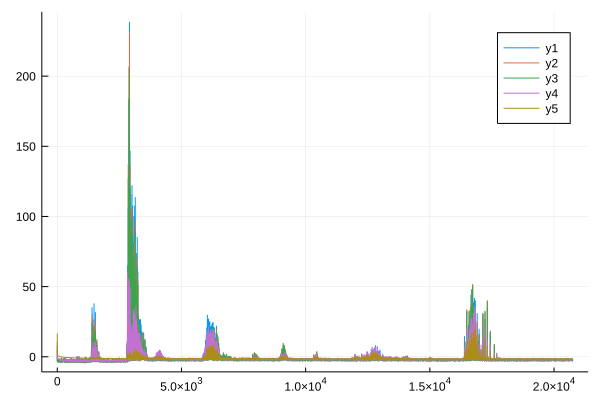

In [279]:
plot(FE_1[:, end])
plot!(FE_2[:, end])
plot!(FE_3[:, end])
plot!(FE_4[:, end])
plot!(FE_10[:, end])

In [232]:
sum(FE_1, dims=(1, ))/size(FE_1, 1)

1×10 Array{Float64,2}:
 -1.28231  -1.28251  -1.28251  -1.28251  …  -1.28252  -1.28252  -1.28252

In [233]:
sum(FE_2, dims=(1, ))/size(FE_1, 1)

1×10 Array{Float64,2}:
 -1.60634  -1.60662  -1.60664  -1.60664  …  -1.60665  -1.60665  -1.60666

In [234]:
sum(FE_3, dims=(1, ))/size(FE_1, 1)

1×10 Array{Float64,2}:
 -1.73313  -1.73338  -1.73341  -1.73342  …  -1.73345  -1.73346  -1.73346

In [247]:
sum(FE_4, dims=(1, ))/size(FE_1, 1)

1×10 Array{Float64,2}:
 -1.60719  -1.6073  -1.60736  -1.60739  …  -1.60744  -1.60745  -1.60746

In [207]:
sum(FE_10, dims=(1, ))/size(FE_1, 1)

1×10 Array{Float64,2}:
 -1.41177  -1.41206  -1.41229  -1.4125  …  -1.41322  -1.41336  -1.41346

# Results

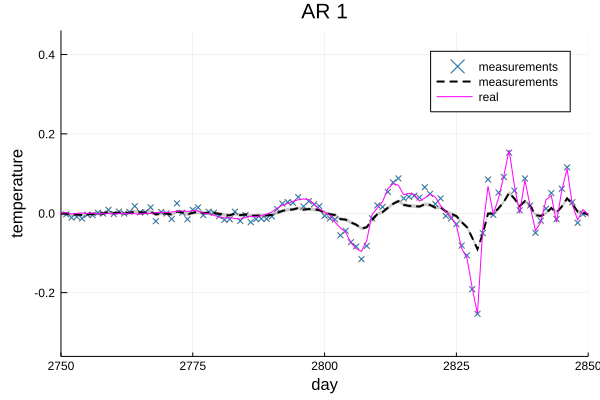

In [236]:
lims=(2750, 2850)
plot(xlims = lims, title="AR 1")
scatter!(ns, markershape = :xcross, markeralpha = 0.6, markersize = 2, label="measurements")
plot!(params_x_1[1][1, :][2:end], ribbon=sqrt.(inv.(params_x_1[2][1, 1, :][2:end])), linestyle=:dash, linewidth = 2, color=:black, fillalpha = 0.2, fillcolor = :black, label="measurements")
plot!(cl, label="real", color="magenta",  xlabel="day", ylabel="temperature")

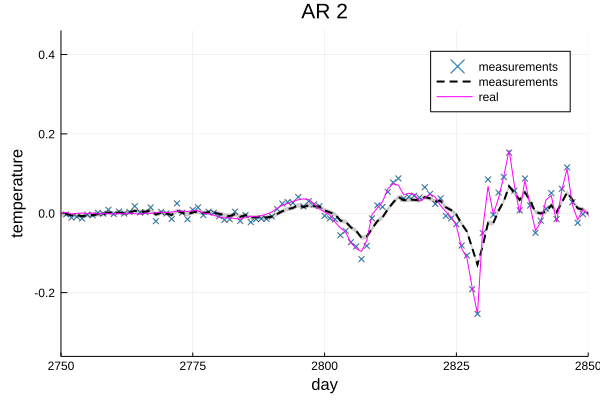

In [237]:
lims=(2750, 2850)
plot(xlims = lims, title="AR 2")
scatter!(ns, markershape = :xcross, markeralpha = 0.6, markersize = 2, label="measurements")
plot!(params_x_2[1][1, :][2:end], ribbon=sqrt.(inv.(params_x_2[2][1, 1, :][2:end])), linestyle=:dash, linewidth = 2, color=:black, fillalpha = 0.2, fillcolor = :black, label="measurements")
plot!(cl, label="real", color="magenta",  xlabel="day", ylabel="temperature")

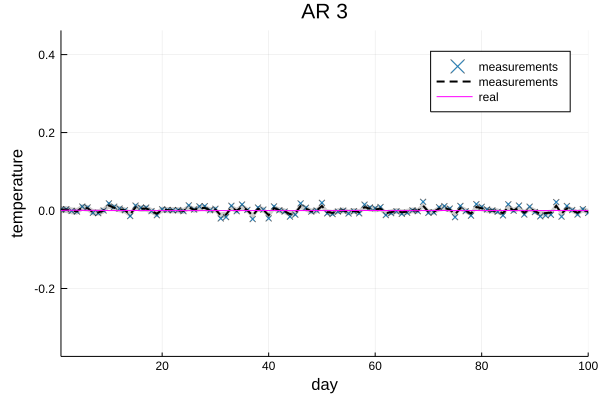

In [281]:
lims=(1, 100)
plot(xlims = lims, title="AR 3")
scatter!(ns, markershape = :xcross, markeralpha = 0.6, markersize = 2, label="measurements")
plot!(params_x_3[1][1, :][2:end], ribbon=sqrt.(inv.(params_x_3[2][1, 1, :][2:end])), linestyle=:dash, linewidth = 2, color=:black, fillalpha = 0.2, fillcolor = :black, label="measurements")
plot!(cl, label="real", color="magenta",  xlabel="day", ylabel="temperature")

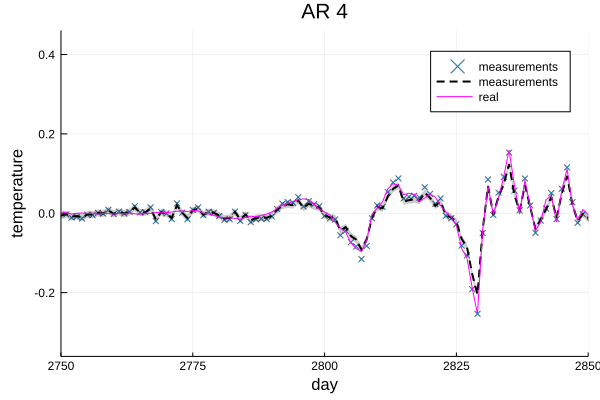

In [248]:
lims=(2750, 2850)
plot(xlims = lims, title="AR 4")
scatter!(ns, markershape = :xcross, markeralpha = 0.6, markersize = 2, label="measurements")
plot!(params_x_4[1][1, :][2:end], ribbon=sqrt.(inv.(params_x_4[2][1, 1, :][2:end])), linestyle=:dash, linewidth = 2, color=:black, fillalpha = 0.2, fillcolor = :black, label="measurements")
plot!(cl, label="real", color="magenta",  xlabel="day", ylabel="temperature")

In [249]:
# filtered speech
cleanSpeech = reshape(params_x_4[1][1, :], length(params_x_4[1][1, :]), 1)
buf_fl = SampleBuf{Float64, 2}(cleanSpeech, fs)

20753-frame, 1-channel SampleBuf{Float64, 2}
2.594125s sampled at 8000.0Hz
▄▄▄▄▄▅▅▄▄▄▆▆▆▆▅▆▆▅▄▄▄▄▆▇▇▆▅▅▅▅▆▅▄▄▆▆▄▄▄▆▆▄▄▄▄▅▅▆▆▆▆▅▅▅▅▄▄▅▅▄▄▄▅▆▇▆▆▆▆▄▄▄▄▄▄▄▄▄▄▄

In [156]:
wavwrite(cleanSpeech, "data/speech/filtered.wav")

In [250]:
# noised speech
buf_ns = SampleBuf{Float64, 2}(ns, fs)

20752-frame, 1-channel SampleBuf{Float64, 2}
2.594s sampled at 8000.0Hz
▄▄▄▄▄▅▅▄▄▄▆▆▇▆▅▆▆▅▄▄▄▄▆▇▇▆▅▅▅▅▆▅▄▄▆▆▄▄▄▆▆▄▄▄▄▅▆▆▆▆▆▅▅▅▅▄▄▅▅▄▄▄▅▆▇▆▆▆▆▄▄▄▄▄▄▄▄▄▄▄

In [251]:
; python spectrograms.py

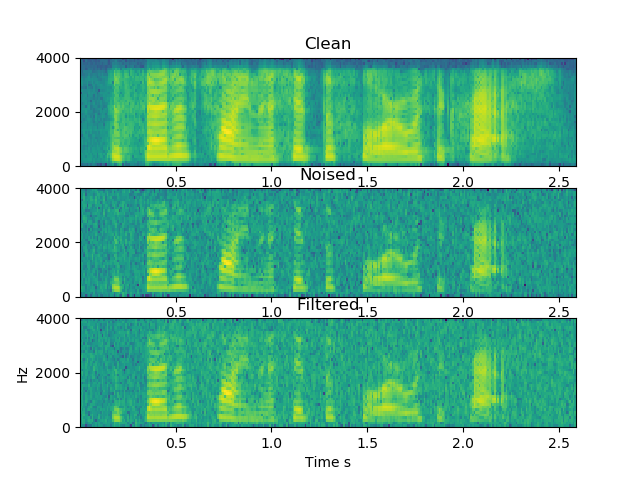

In [252]:
using Images
img = load("data/speech/result.png")

In [58]:
anim = @animate for i in 1:segnum
    s = plot(bg = RGB(241/255, 239/255, 239/255))
    ylims!(minimum(segment[i]) - .5, maximum(segment[i]) + .5);
    scatter!(segment[i, :], label="Noised", 
             markershape = :xcross, markeralpha = 0.6,
             markersize = 2)
    
    plot!(rmx[i, :], ribbon=sqrt.(rvx[i, :]),
          linestyle=:dash, linewidth = 2, color=:black, fillalpha = 0.2, fillcolor = :black,
          label="Filtered")
    
    plot!(zseg[i, :], color = :magenta, linewidth = 1.0, label="Clean speech")
end

Animation("/var/folders/jn/1xv7kskx42v_97gx1xd8y_g40000gq/T/jl_CbazHh", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "000164.png", "000165.png", "000166.png", "000167.png", "000168.png", "000169.png", "000170.png", "000171.png", "000172.png", "000173.png"])

┌ Info: Saved animation to 
│   fn = /Users/albertpod/Julia/TVARFFG/data/inference.gif
└ @ Plots /Users/albertpod/.julia/packages/Plots/qZHsp/src/animation.jl:98


Plots.AnimatedGif("/Users/albertpod/Julia/TVARFFG/data/inference.gif")
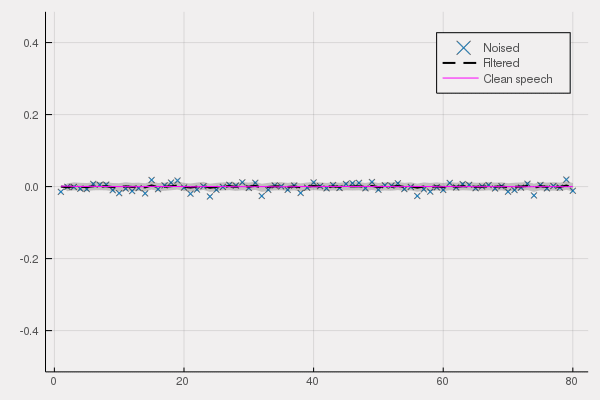

In [59]:
gif(anim, "data/speech/inference.gif", fps = 2)